In [1]:
########################################################################### START ###########################################################################
# Access to Drive
# Modules
# Data import
# DataFrames

## Gives access to the Drive
from google.colab import drive
drive.mount('/content/drive')

## Modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2

import sys, os
from pathlib import Path
import shutil
import glob
import itertools

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from tensorflow.keras.applications import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, TerminateOnNaN, EarlyStopping

from tensorflow.keras.utils import Sequence
from collections import Counter
from sklearn.utils.class_weight import compute_class_weight

from keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix

sys.path.append('/content/drive/MyDrive/Leukopy')
import leukopy_lib as leuko
from importlib import reload

reload(leuko)

## GPU status verification
tf.test.gpu_device_name()

## GPU type verification
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Mounted at /content/drive
Fri Oct  1 15:32:39 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    35W / 250W |    345MiB / 16280MiB |      1%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                              

In [ ]:
#######################################################################################################################################################################################
########################################################################### IMPORT DATA + CREATE DATAFRAMES ###########################################################################
#######################################################################################################################################################################################

In [ ]:
## Need to copy all the files on the local computer
!cp -r "/content/drive/MyDrive/Leukopy/data/main_dataset.zip" .
!unzip main_dataset.zip

## Create the original dataframes
path = Path('/content/main_dataset/')

df_train = leuko.generate_images_df(path/'training_set')
df_test = leuko.generate_images_df(path/'testing_set')
df_valid = leuko.generate_images_df(path/'validation_set')

In [3]:
def choose_classes(df_train, df_test, df_valid, n_classes = 11):

  """ Pour travailler avec 11 ou 8 classes. Les BL (blastes) sont une classe de cellules minoritaires provenant d'un dataset différent de celui fournissant les
  images des N-1 autres classes. En raison d'un biais évident, nous ne travaillons pas avec ces images.
  """

  # Option à 11 classes, sans les BL
  if n_classes == 11:
    df_train = df_train[df_train["label"] != "BL"]
    df_test = df_test[df_test["label"] != "BL"]
    df_valid = df_valid[df_valid["label"] != "BL"]

  # Option à 8 classes (IG, SNE et BNE dans la même classe "NEU"), sans les BL :
  if n_classes == 8:

    # Elimine les BL :
    df_train = df_train[df_train["label"] != "BL"]
    df_test = df_test[df_test["label"] != "BL"]
    df_valid = df_valid[df_valid["label"] != "BL"]

    # Renomme SNE/BNE en NEU :
    df_train["label_3"] = df_train["label_3"].replace(to_replace = ["SNE","BNE"], value = ["NEU","NEU"])
    df_valid["label_3"] = df_valid["label_3"].replace(to_replace = ["SNE","BNE"], value = ["NEU","NEU"])
    df_test["label_3"] = df_test["label_3"].replace(to_replace = ["SNE","BNE"], value = ["NEU","NEU"])

    # Sélectionne les label_3 comme labels :
    df_train["label"] = df_train["label_3"]
    df_test["label"] = df_test["label_3"]
    df_valid["label"] = df_valid["label_3"]

  return n_classes, df_train, df_test, df_valid

In [4]:
n_classes, df_train, df_test, df_valid = choose_classes(df_train, df_test, df_valid, n_classes = 11)
classes = list(df_train["label"].sort_values().unique())

In [ ]:
#######################################################################################################################################################################################
#################################################################################### PREPROCESSING ####################################################################################
#######################################################################################################################################################################################

In [6]:
batch_size = 32
img_height  = 360
img_width = 360

train_generator = ImageDataGenerator(rotation_range = 90,
                                     horizontal_flip = True, 
                                     vertical_flip = True)
valid_generator = ImageDataGenerator()
test_generator = ImageDataGenerator()

# Resize pictures, batchs from dataframe
training_set = train_generator.flow_from_dataframe(df_train, 
                                                   directory = None, # utilise x_col
                                                   x_col = 'img_path', 
                                                   y_col = 'label',
                                                   target_size = (img_height, img_width), 
                                                   color_mode = 'rgb',
                                                   classes = None,   # utilise y_col
                                                   class_mode = 'categorical', 
                                                   batch_size = batch_size,
                                                   shuffle = True,
                                                   preprocessing_function = preprocess_input)

validation_set = valid_generator.flow_from_dataframe(df_valid, 
                                                     directory = None, # utilise x_col
                                                     x_col = 'img_path', 
                                                     y_col = 'label',
                                                     target_size = (img_height, img_width), 
                                                     color_mode = 'rgb',
                                                     classes = None,   # utilise y_col
                                                     class_mode = 'categorical', 
                                                     batch_size = batch_size, 
                                                     shuffle = True,
                                                     preprocessing_function = preprocess_input)

testing_set = test_generator.flow_from_dataframe(df_test, 
                                                 directory = None, # utilise x_col
                                                 x_col = 'img_path', 
                                                 y_col = 'label',
                                                 target_size = (img_height, img_width),
                                                 color_mode = 'rgb',
                                                 classes = None,   # utilise y_col
                                                 class_mode = 'categorical', 
                                                 batch_size = batch_size, 
                                                 shuffle = False, 
                                                 preprocessing_function = preprocess_input)

# Labels/Index connection :
label_map = training_set.class_indices
print('Train :', training_set.class_indices)
print('Valid :', validation_set.class_indices)
print('Test  :', testing_set.class_indices)

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.
Train : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Valid : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}
Test  : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


In [ ]:
########################################################################################################################################################################################
####################################################################################### GRAD-CAM #######################################################################################
########################################################################################################################################################################################

In [7]:
import matplotlib.cm as cm
def get_img_array(img_path, size = (img_height, img_width)):
  
  img = tf.keras.preprocessing.image.load_img(img_path, target_size = size)
  array = tf.keras.preprocessing.image.img_to_array(img)
  array = np.expand_dims(array, axis = 0)
  return array

def make_heatmap(img_array, model, last_conv_layer, class_index):

  grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])
  with tf.GradientTape() as tape:
    last_conv_layer_output, preds = grad_model(img_array)
    class_channel = preds[:, class_index]

  grads = tape.gradient(class_channel, last_conv_layer_output)
  pooled_grads = tf.reduce_mean(grads, axis = (0, 1, 2))

  heatmap_tmp = last_conv_layer_output[0].numpy()

  for i in range(last_conv_layer_output.shape[3]):
    heatmap_tmp[:,:,i] *= pooled_grads[i]
  heatmap = np.mean(heatmap_tmp, axis=-1)
  return heatmap

def gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.5, plot = True):

  # Détecte la dernière couche de convolution (pas terrible : il faudrait sélectionner sur le type, pas sur le nom) :
  for layer in reversed(model.layers):
    if 'conv' in layer.name:
      last_conv_layer = model.get_layer(layer.name)
      break

  # Chargement + mise en forme de l'image :
  img_array = get_img_array(img_path, size = (img_height, img_width))

  # Choix de la classe à représenter :
  if class_index == None :
    # Désactiver Sotfmax sur la couche de sortie :
    model.layers[-1].activation = None
    # Prédiction + classe la plus probable :
    predict = model.predict(img_array)
    class_index = np.argmax(predict[0])

  # Calcul de la CAM : resize pour comparaison avec l'image finale
  heatmap = make_heatmap(img_array, model, last_conv_layer, class_index)
  big_heatmap = heatmap
  #big_heatmap = cv2.resize(heatmap, dsize = (img_height, img_width), interpolation = cv2.INTER_CUBIC)

  ## Traitement de la Heatmap
  # 1/ Normalisation
  big_heatmap = big_heatmap/big_heatmap.max()
  # 2/ On passe dans ReLu, pour flinguer les valeurs négatives
  big_heatmap = np.maximum(0, big_heatmap)
  
  ## Superposition de l'image et de la Heatmap 
  # 1/ Import de l'image d'origine
  img = tf.keras.preprocessing.image.load_img(img_path)
  img = tf.keras.preprocessing.image.img_to_array(img)

  # 2/ Rescale heatmap: 0-255
  big_heatmap = np.uint8(255*big_heatmap)

  # 3/ Jet colormap
  jet = cm.get_cmap("jet")

  # 4/ Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[big_heatmap]
  
  # 5/ Create an image with RGB colorized heatmap
  jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

  # 6/ Superimpose the heatmap on original image
  superimposed_img = jet_heatmap*alpha + img
  superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

  if plot == True:
    # 7/ Affichage des résultats
    fig = plt.figure(figsize = (8,8))
    fig.add_subplot(1,2,1)
    plt.imshow(big_heatmap)

    fig.add_subplot(1,2,2)
    plt.imshow(superimposed_img)
    plt.title("Chosen class : "+str(list(label_map.keys())[class_index]))

  # Réactive softmax si elle a été désactivée plus haut :
  if class_index == None :
    model.layers[-1].activation = 'softmax'

  return big_heatmap, superimposed_img

In [ ]:
#######################################################################################################################################################################################
######################################################################################## MODEL ########################################################################################
#######################################################################################################################################################################################

In [8]:
# Calcul des poids pour compenser le déséquilibre des classes

def compute_weights(method = 3):

  if method == 1:
    counter = Counter(training_set.classes)     
    class_weights = {class_id : float(max(counter.values()))/num_images for class_id, num_images in counter.items()} 
    return class_weights

  if method == 2:
    class_weights = compute_class_weight(class_weight = 'balanced',
                                         classes = np.unique(training_set.classes),
                                         y = training_set.classes)
    class_weights = dict(enumerate(class_weights))
    return class_weights

  counter = Counter(training_set.classes)                          
  class_weights = {class_id : (1/num_images)*float(sum(counter.values()))/2 for class_id, num_images in counter.items()}
  return class_weights

In [ ]:
################################################### MODEL - FUNC. (Test 05/08/2021 - Inf. Mode) ####################################################
# VGG19 + Dense(1280, Relu) + Dropout(0.2) + Dense(640, Relu) + Dropout(0.2) + Dense(n_classes, Softmax) 
# weights = 'ImageNet'
# include_top = False

# Model (Functional API)
inputs = layers.Input(shape = (img_height,img_width,3))
base_model = VGG19(include_top = False,
                   weights = "imagenet",
                   input_tensor = inputs,
                   input_shape = (img_height,img_width,3),
                   pooling = 'avg')
base_model.training = False     # Nécessaire pour le fine-tuning ensuite : sans ça, le modèle est perdu...
base_output = base_model.output # Cette écriture permet d'avoir les couches de "base_model" au même niveau que les couches suivantes (voir model.summary())=> Grad-CAM peut fonctionner
x = layers.Dense(units = 1280, activation = 'relu', name = 'dense_1')(base_output)
x = layers.Dropout(rate = 0.2, name = 'dropout_1')(x)
x = layers.Dense(units = 640, activation = 'relu', name = 'dense_2')(x)
x = layers.Dropout(rate = 0.2, name = 'dropout_2')(x)
outputs = layers.Dense(units = n_classes, activation = 'softmax', name = 'final_softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_model.trainable = False

# Compile
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-3)
model.compile(optimizer = optimizer, 
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

80150528/80134624 [==============================] - 1s 0us/step


In [ ]:
# Structure du modèle
model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 360, 360, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 360, 360, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 360, 360, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 180, 180, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 180, 180, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 180, 180, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 90, 90, 128)       0     

In [ ]:
## Schéma du modèle :

from tensorflow.keras.utils import plot_model

plot_model(model,
           to_file = "model_VGG19_TL.png",
           show_shapes = True,
           show_layer_names = True)

!cp -r "model_VGG19_TL.png" "/content/drive/MyDrive/Leukopy/VGG19_TL_11"

In [ ]:
## Training (05/08/2021) - VGG19 with Inf. Mode
# Callbacks
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                               factor = 0.1, patience = 2, verbose = 1, mode = 'min', min_lr = 1e-6)
  
early_stopping = EarlyStopping(monitor = "val_loss", patience = 3, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]
                    
## Compute weights :
class_weights = compute_weights(method = 3)

## Training :
epochs = 30
training_history = model.fit(x = training_set, 
                             epochs = epochs,
                             callbacks = callbacks_list,
                             validation_data = validation_set, 
                             class_weight = class_weights)

Epoch 1/30
397/397 [==============================] - 429s 1s/step - loss: 8.0979 - accuracy: 0.5072 - val_loss: 1.0348 - val_accuracy: 0.6156
Epoch 2/30
397/397 [==============================] - 402s 1s/step - loss: 5.1068 - accuracy: 0.6647 - val_loss: 0.7963 - val_accuracy: 0.7208
Epoch 3/30
397/397 [==============================] - 395s 995ms/step - loss: 4.5888 - accuracy: 0.7034 - val_loss: 0.7288 - val_accuracy: 0.7202
Epoch 4/30
397/397 [==============================] - 394s 992ms/step - loss: 4.1705 - accuracy: 0.7309 - val_loss: 0.7245 - val_accuracy: 0.7179
Epoch 5/30
397/397 [==============================] - 394s 992ms/step - loss: 4.0813 - accuracy: 0.7397 - val_loss: 0.6426 - val_accuracy: 0.7636
Epoch 6/30
397/397 [==============================] - 392s 986ms/step - loss: 3.8984 - accuracy: 0.7559 - val_loss: 0.6370 - val_accuracy: 0.7613
Epoch 7/30
397/397 [==============================] - 392s 987ms/step - loss: 3.7990 - accuracy: 0.7548 - val_loss: 0.6084 - val_a

In [ ]:
## Sauvegarde avant FT
model.save("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_trainfalse")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_trainfalse/assets


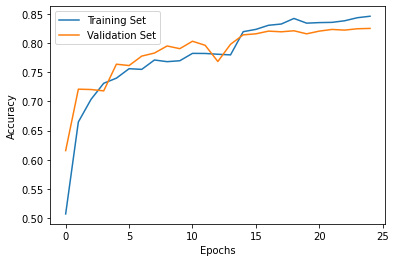

In [ ]:
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

plt.figure()
plt.plot(np.arange(early_stopping.stopped_epoch), training_accuracy[0:early_stopping.stopped_epoch], label = 'Training Set')
plt.plot(np.arange(early_stopping.stopped_epoch), validation_accuracy[0:early_stopping.stopped_epoch], label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
## Évaluation sur les données de test :
model.evaluate(testing_set)

80/80 [==============================] - 18s 229ms/step - loss: 0.4321 - accuracy: 0.8357


[0.4320944547653198, 0.8356918096542358]

In [ ]:
#######################################################################################################################################################################################
############################################################################## ANALYSE AVANT FINE-TUNING ##############################################################################
#######################################################################################################################################################################################

In [ ]:
# Recharge le modèle si besoin
#model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_trainfalse")

In [ ]:
model.evaluate(testing_set)

80/80 [==============================] - 63s 471ms/step - loss: 0.4321 - accuracy: 0.8357


[0.43209439516067505, 0.8356918096542358]

In [ ]:
model.evaluate(training_set)

397/397 [==============================] - 386s 973ms/step - loss: 0.3722 - accuracy: 0.8552


[0.37217235565185547, 0.8552496433258057]

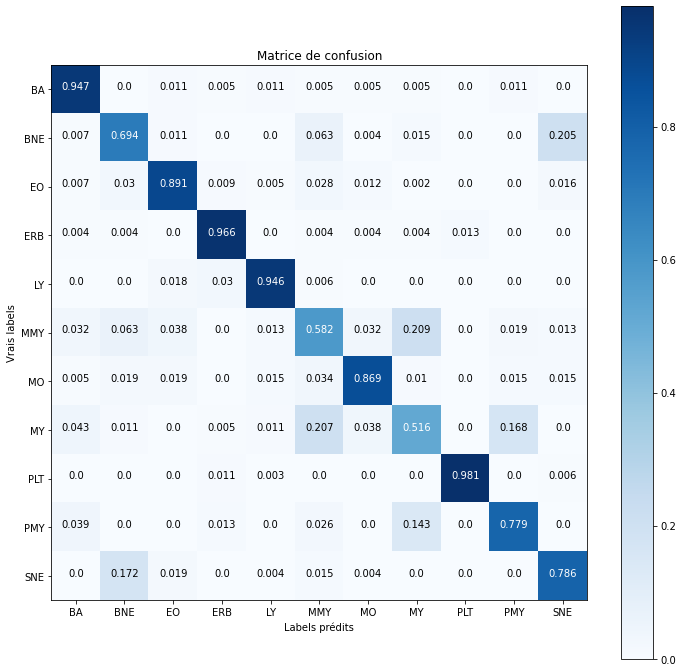

Classification Report : avant Fine-Tuning


,precision,recall,f1-score,support
BA,0.886139,0.94709,0.915601,189
BNE,0.712644,0.69403,0.703214,268
EO,0.943627,0.891204,0.916667,432
ERB,0.934694,0.966245,0.950207,237
LY,0.924419,0.946429,0.935294,168
MMY,0.525714,0.582278,0.552553,158
MO,0.895,0.868932,0.881773,206
MY,0.641892,0.516304,0.572289,184
PLT,0.991643,0.980716,0.98615,363
PMY,0.606061,0.779221,0.681818,77


In [ ]:
### 1 -- Matrice de confusion + rapport de classification ("présentable")

def print_classification_report(testing_set, labels):

  # Prédiction : utilise le jeu de test (testing_set)
  predictions = model.predict(testing_set)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(testing_set.classes, y_pred, normalize = 'true')
  classes = range(len(labels))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion")
  plt.colorbar()

  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels)
  plt.yticks(tick_marks, labels)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Vrais labels')
  plt.xlabel('Labels prédits')
  plt.show()

  # Rapport de classification 
  report = classification_report(testing_set.classes, y_pred, target_names = labels, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  
  print("Classification Report : avant Fine-Tuning")
  return display(df_report)


## Bilan sur les données de test :
print_classification_report(testing_set, label_map)

# Ajouter fonction pour enregistrer df_report dans un .csv + transfert sur Drive

In [ ]:
#######################################################################################################################################################################################
################################################################################### TUNING BLOCK 5 ####################################################################################
#######################################################################################################################################################################################

In [ ]:
## Callbacks
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                               factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-7)
  
early_stopping = EarlyStopping(monitor = "val_loss",
                               patience = 4, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]
                    
## Compute weights :
class_weights = compute_weights(method = 3)

## Unfreeze Block5 + Compile   (Rq: on pourrait essayer de dégeler block4 + block5)

for layer in model.layers:
  if "block5" in layer.name:
    layer.trainable = True

optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-5)
model.compile(optimizer = optimizer,
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

In [ ]:
## Training :
epochs = 30
fine_history = model.fit(x = training_set,
                         epochs = epochs,
                         callbacks = callbacks_list, 
                         validation_data = validation_set, 
                         class_weight = class_weights)

Epoch 1/30
397/397 [==============================] - 410s 1s/step - loss: 2.4579 - accuracy: 0.8548 - val_loss: 0.3515 - val_accuracy: 0.8659
Epoch 2/30
397/397 [==============================] - 406s 1s/step - loss: 1.9932 - accuracy: 0.8827 - val_loss: 0.3530 - val_accuracy: 0.8717
Epoch 3/30
397/397 [==============================] - 404s 1s/step - loss: 1.7783 - accuracy: 0.8987 - val_loss: 0.3019 - val_accuracy: 0.8821
Epoch 4/30
397/397 [==============================] - 404s 1s/step - loss: 1.7235 - accuracy: 0.9014 - val_loss: 0.2759 - val_accuracy: 0.9017
Epoch 5/30
397/397 [==============================] - 405s 1s/step - loss: 1.6049 - accuracy: 0.9053 - val_loss: 0.3057 - val_accuracy: 0.8908
Epoch 6/30
397/397 [==============================] - 405s 1s/step - loss: 1.5353 - accuracy: 0.9109 - val_loss: 0.2563 - val_accuracy: 0.9064
Epoch 7/30
397/397 [==============================] - 405s 1s/step - loss: 1.4784 - accuracy: 0.9106 - val_loss: 0.2983 - val_accuracy: 0.8867

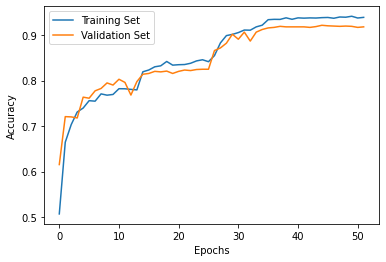

In [ ]:
training_accuracy = training_history.history['accuracy'] + fine_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy'] + fine_history.history['val_accuracy']
training_epochs = len(training_accuracy)

plt.figure()
plt.plot(range(training_epochs), training_accuracy, label = 'Training Set')
plt.plot(range(training_epochs), validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.evaluate(testing_set)

80/80 [==============================] - 15s 190ms/step - loss: 0.2321 - accuracy: 0.9127


[0.23206640779972076, 0.9127358198165894]

In [ ]:
## Sauvegarde :
model.save("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_ftblock5")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_ftblock5/assets


In [ ]:
###### ANALYSE : TUNING BLOCK 5 ######

In [22]:
model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_ftblock5")
model.evaluate(testing_set)

80/80 [==============================] - 15s 187ms/step - loss: 0.2321 - accuracy: 0.9127


[0.23206639289855957, 0.9127358198165894]

In [23]:
def print_classification_report(testing_set, labels, title):

  # Prédiction : utilise le jeu de test (testing_set)
  predictions = model.predict(testing_set)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(testing_set.classes, y_pred, normalize = 'true')
  classes = range(len(labels))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion - "+title)
  plt.colorbar()

  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels)
  plt.yticks(tick_marks, labels)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Vrais labels')
  plt.xlabel('Labels prédits')
  plt.show()

  # Rapport de classification 
  report = classification_report(testing_set.classes, y_pred, target_names = labels, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  
  print("Classification Report - "+title)
  return y_pred, display(df_report)

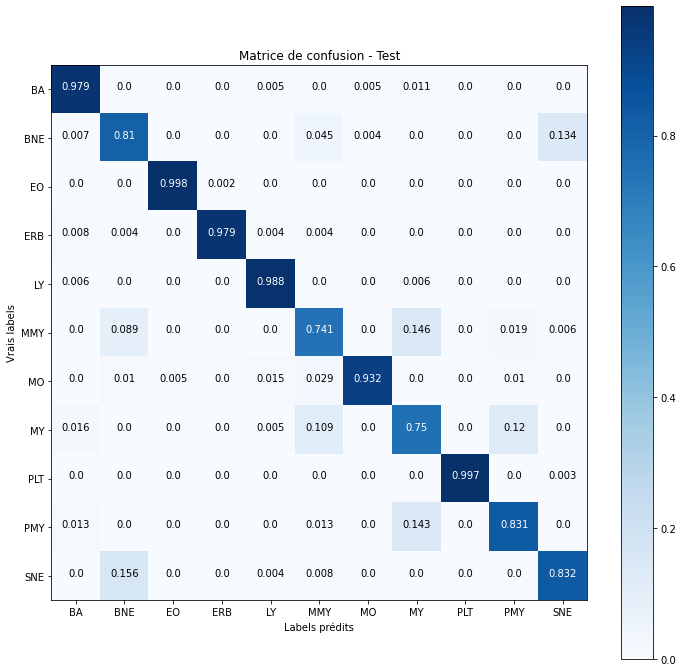

Classification Report - Test


,precision,recall,f1-score,support
BA,0.953608,0.978836,0.966057,189
BNE,0.789091,0.809701,0.799263,268
EO,0.997685,0.997685,0.997685,432
ERB,0.995708,0.978903,0.987234,237
LY,0.959538,0.988095,0.973607,168
MMY,0.735849,0.740506,0.73817,158
MO,0.989691,0.932039,0.96,206
MY,0.788571,0.75,0.768802,184
PLT,1,0.997245,0.998621,363
PMY,0.703297,0.831169,0.761905,77


In [24]:
### 1 -- Rapport de classification
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [25]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

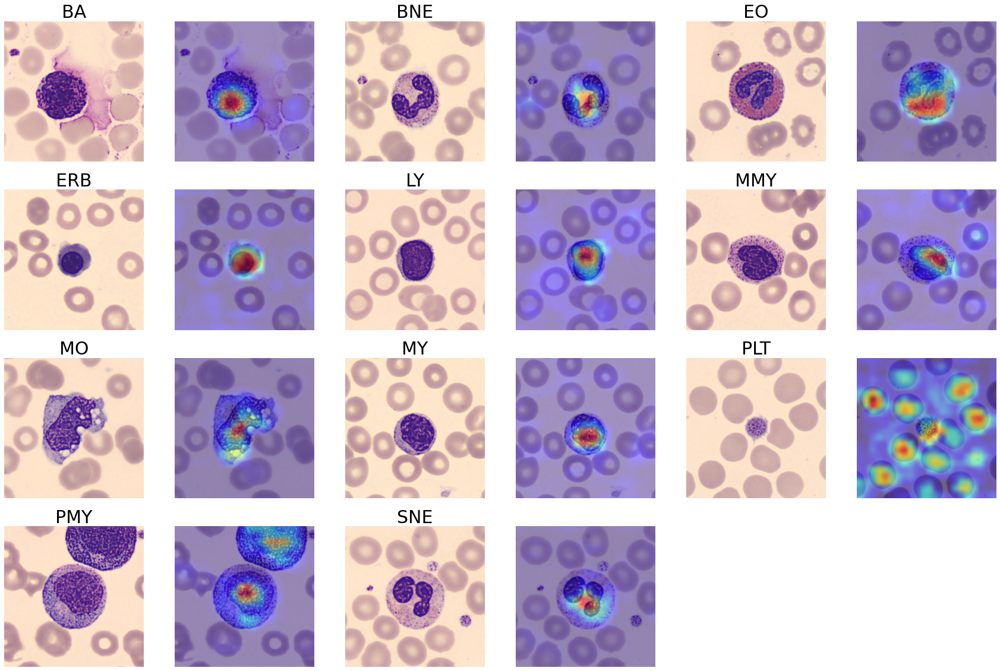

In [14]:
### 3 - Grad-CAM - bien classées
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,20))
i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/VGG19_TL_11/vgg19_gradcam")

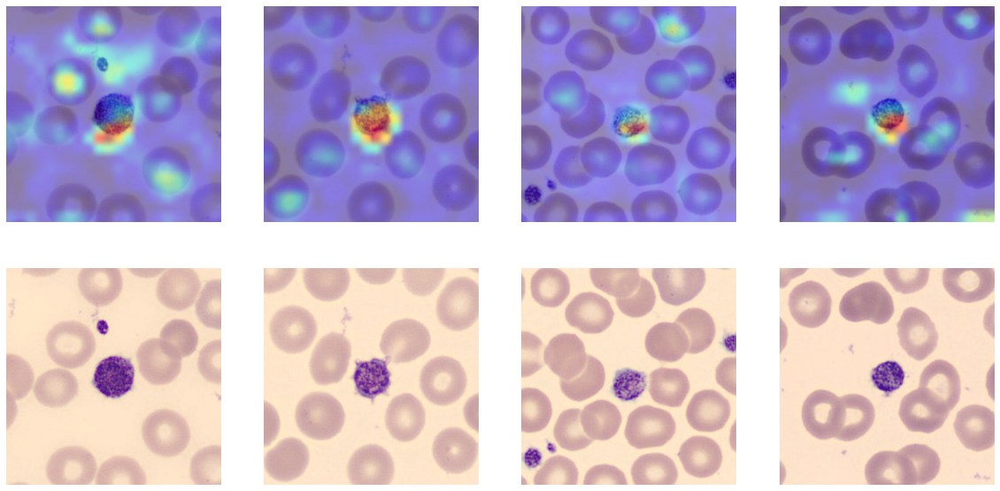

In [16]:
## Cas des PLT : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_PLT = df_true[df_true["real"] == 8]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_PLT.index)
  img_path = df_PLT.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

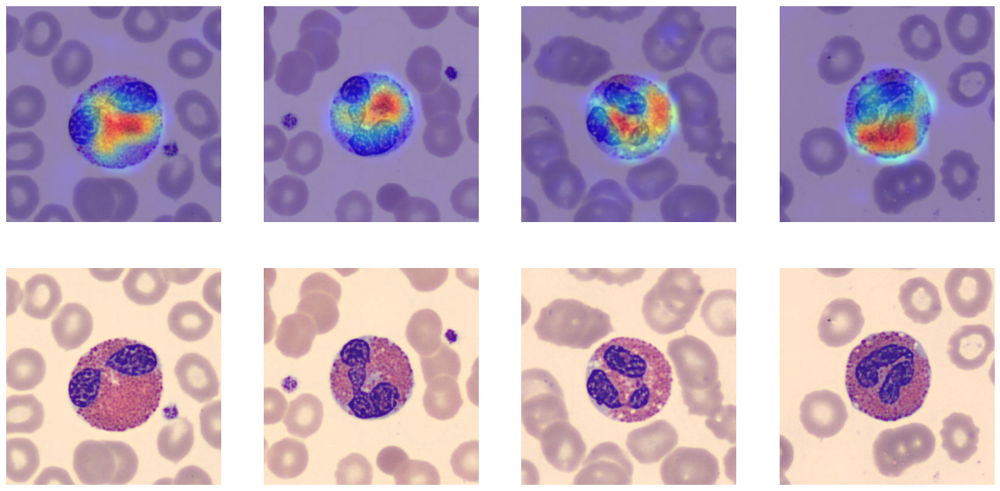

In [26]:
## Cas des EO : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_EO = df_true[df_true["real"] == 2]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_EO.index)
  img_path = df_EO.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

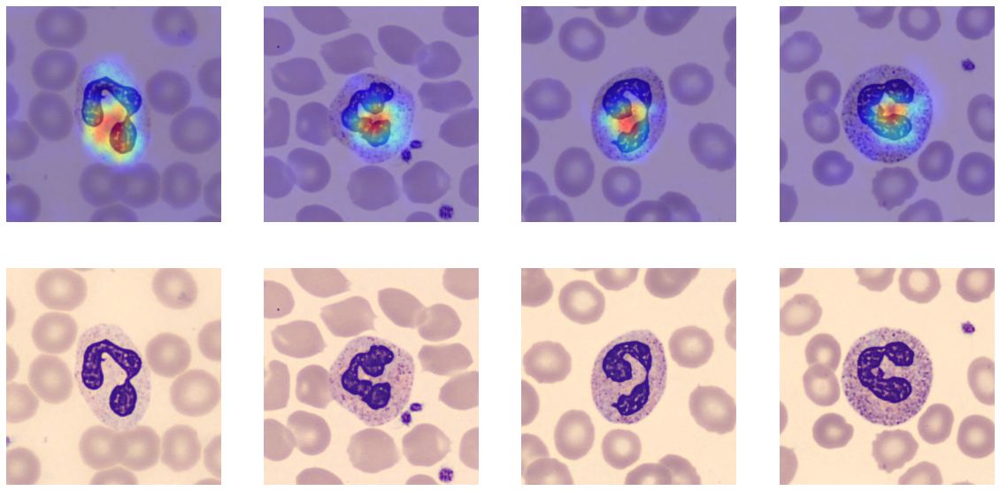

In [27]:
## Cas des SNE : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_SNE = df_true[df_true["real"] == 10]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_SNE.index)
  img_path = df_SNE.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

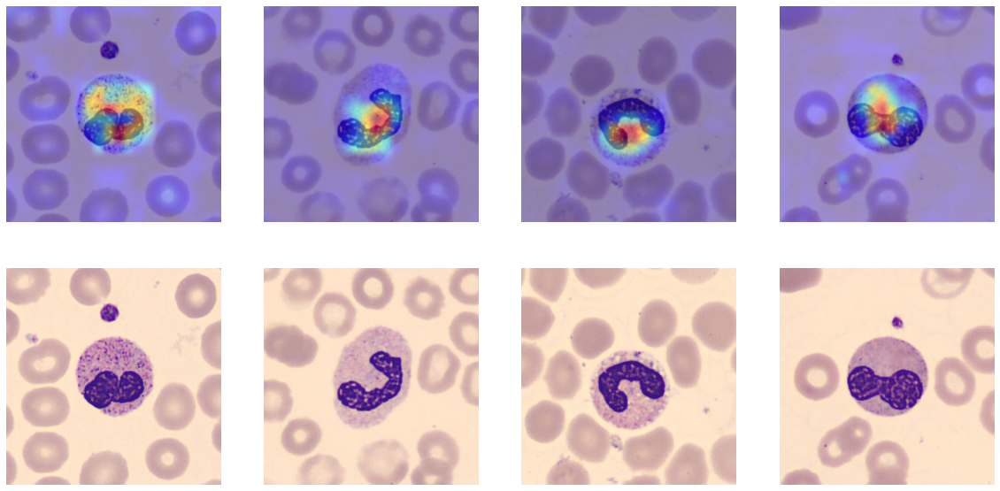

In [28]:
## Cas des BNE : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_BNE = df_true[df_true["real"] == 1]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_BNE.index)
  img_path = df_BNE.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

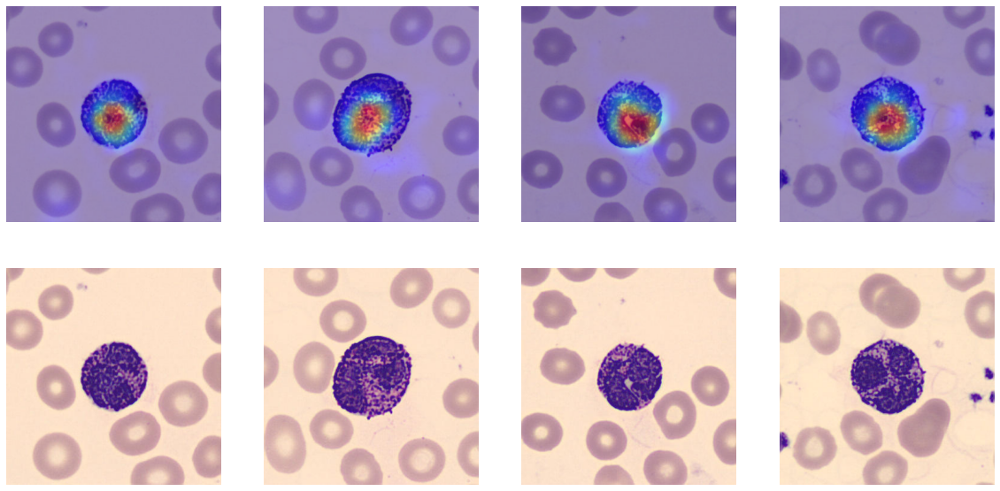

In [30]:
## Cas des BA : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_BA = df_true[df_true["real"] == 0]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_BA.index)
  img_path = df_BA.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

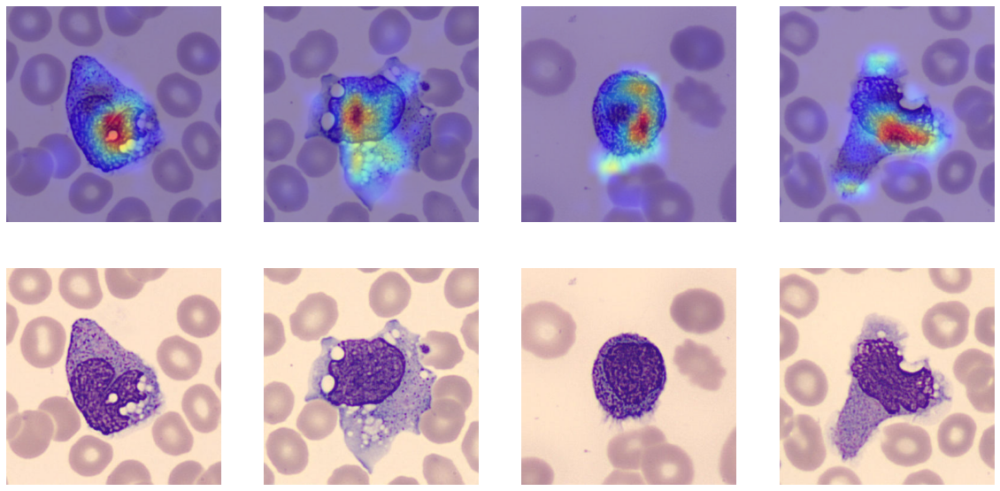

In [31]:
## Cas des MO : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_MO = df_true[df_true["real"] == 6]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_MO.index)
  img_path = df_MO.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

In [ ]:
"""
Le tuning de VGG a amélioré le F1 de toutes les classes sans exception. Toujours des problèmes avec MY/MMY/PMY et BNE/SNE.
Pistes : 
1°/ fine-tuning du 'block4' en plus du 'block5' 
ou
2°/ Procéder en deux temps : d'abord dégeler le block5 et entraîner, puis dégeler le block4 et entraîner.
Rq : je ne remonterais pas plus haut que le block4, sinon on risque de trop spécialiser le modèle sur les jolies images de l'hôpital de Barcelone
Rq2 : très peu d'augmentation de données dans ce run du modèle... on pourrait introduire de légères variations sur : luminosité / netteté / zoom
"""

In [ ]:
##################################################### 16/08 : Fine-tuning 'block_4' (Bof) #########################################################

In [ ]:
## Callbacks
TON = TerminateOnNaN()

control_lr = ReduceLROnPlateau(monitor = 'val_loss',
                               factor = 0.1, patience = 3, verbose = 1, mode = 'min', min_lr = 1e-8)
  
early_stopping = EarlyStopping(monitor = "val_loss",
                               patience = 4, mode = 'min', restore_best_weights = True)

callbacks_list = [TON, control_lr, early_stopping]
                    
## Compute weights :
class_weights = compute_weights(method = 3)

## Unfreeze Block4 + Compile

for layer in model.layers:
  if "block4" in layer.name:
    layer.trainable = True

In [ ]:
## Fine-tuning du block4 :
optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-6)
model.compile(optimizer = optimizer,
              loss = "categorical_crossentropy",
              metrics = ["accuracy"])

## Training :
epochs = 30
tune4_history = model.fit(x = training_set, 
                          epochs = epochs,
                          callbacks = callbacks_list, 
                          validation_data = validation_set, 
                          class_weight = class_weights)

Epoch 1/30
397/397 [==============================] - 424s 1s/step - loss: 1.1165 - accuracy: 0.9333 - val_loss: 0.2293 - val_accuracy: 0.9168
Epoch 2/30
397/397 [==============================] - 418s 1s/step - loss: 1.0545 - accuracy: 0.9388 - val_loss: 0.2326 - val_accuracy: 0.9197
Epoch 3/30
397/397 [==============================] - 417s 1s/step - loss: 1.0395 - accuracy: 0.9382 - val_loss: 0.2351 - val_accuracy: 0.9168
Epoch 4/30
397/397 [==============================] - 415s 1s/step - loss: 1.0253 - accuracy: 0.9395 - val_loss: 0.2198 - val_accuracy: 0.9202
Epoch 5/30
397/397 [==============================] - 416s 1s/step - loss: 0.9935 - accuracy: 0.9415 - val_loss: 0.2220 - val_accuracy: 0.9191
Epoch 6/30
397/397 [==============================] - 418s 1s/step - loss: 1.0239 - accuracy: 0.9397 - val_loss: 0.2131 - val_accuracy: 0.9243
Epoch 7/30
397/397 [==============================] - 417s 1s/step - loss: 1.0202 - accuracy: 0.9408 - val_loss: 0.2276 - val_accuracy: 0.9202

In [ ]:
model.evaluate(testing_set)

80/80 [==============================] - 15s 190ms/step - loss: 0.2226 - accuracy: 0.9186


[0.22256478667259216, 0.9186320900917053]

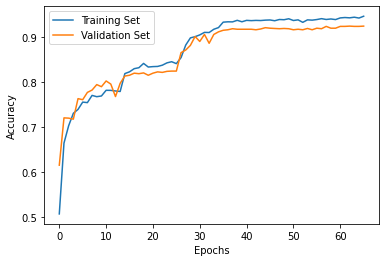

<Figure size 432x288 with 0 Axes>

In [ ]:
training_accuracy = training_accuracy + tune4_history.history['accuracy']
validation_accuracy = validation_accuracy + tune4_history.history['val_accuracy']
training_epochs = len(training_accuracy)

fig = plt.figure()
plt.plot(range(training_epochs), training_accuracy, label = 'Training Set')
plt.plot(range(training_epochs), validation_accuracy, label = 'Validation Set')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.savefig('/content/drive/MyDrive/Leukopy/VGG19_TL_11/training.png')


In [ ]:
model.save("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_ftblock4")

INFO:tensorflow:Assets written to: /content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_ftblock4/assets


In [17]:
###### ANALYSE : TUNING BLOCKS 5 puis 4 ######
model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_ftblock4")
model.evaluate(testing_set)

80/80 [==============================] - 15s 187ms/step - loss: 0.2226 - accuracy: 0.9186


[0.22256477177143097, 0.9186320900917053]

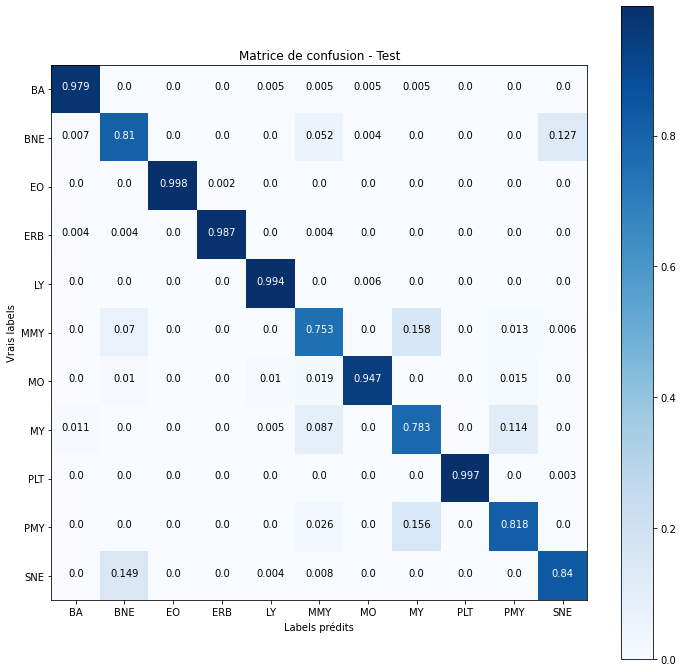

Classification Report - Test


,precision,recall,f1-score,support
BA,0.973684,0.978836,0.976253,189
BNE,0.803704,0.809701,0.806691,268
EO,1,0.997685,0.998841,432
ERB,0.995745,0.987342,0.991525,237
LY,0.97093,0.994048,0.982353,168
MMY,0.748428,0.753165,0.750789,158
MO,0.984848,0.946602,0.965347,206
MY,0.791209,0.782609,0.786885,184
PLT,1,0.997245,0.998621,363
PMY,0.707865,0.818182,0.759036,77


In [18]:
### 1 -- Rapport de classification
y_pred, df_report = print_classification_report(testing_set, label_map, title = "Test")

In [19]:
### 2 - DF avec le résultat et le label de toutes les images du test :
df_results = pd.DataFrame(data = {"real":testing_set.classes,
                                  "pred":y_pred, 
                                  "img_path":df_test["img_path"]})

# Tri des images : mal classé (df_false), bien classé (df_true):
df_false = df_results[df_results["real"] != df_results["pred"]].reset_index(drop = True)
df_true = df_results[df_results["real"] == df_results["pred"]].reset_index(drop = True)

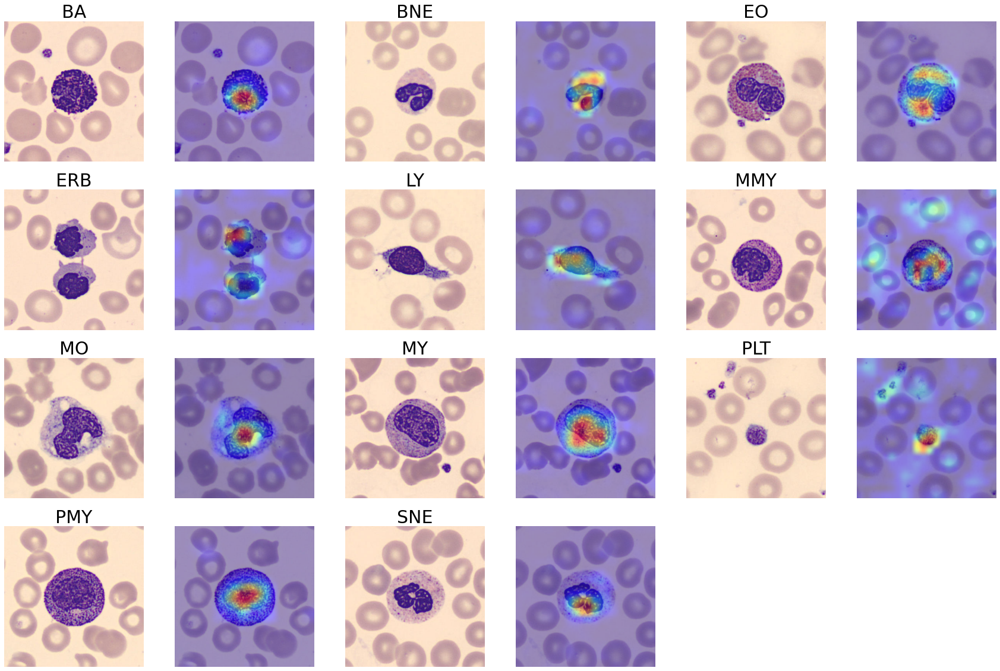

In [20]:
### 3 - Grad-CAM - bien classées
from IPython.display import Image, display
import matplotlib.cm as cm

fig_gc = plt.figure(figsize = (30,20))
i = 1
for label in np.arange(0,11):

  # Tire un index au hasard parmi les index d'une même classe de cellules
  df_temp = df_true[df_true["real"] == label]
  idx = np.random.choice(a = df_temp.index)
        
  img_path = df_temp.loc[idx,"img_path"]

  # Grad-CAM Heatmap + superposition
  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(4,6,i)
  plt.imshow(plt.imread(img_path))
  plt.title(list(label_map.keys())[label], fontsize = 30)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(4,6,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  i+=2

plt.savefig("/content/drive/MyDrive/Leukopy/VGG19_TL_11/vgg19_gradcam_ft54")

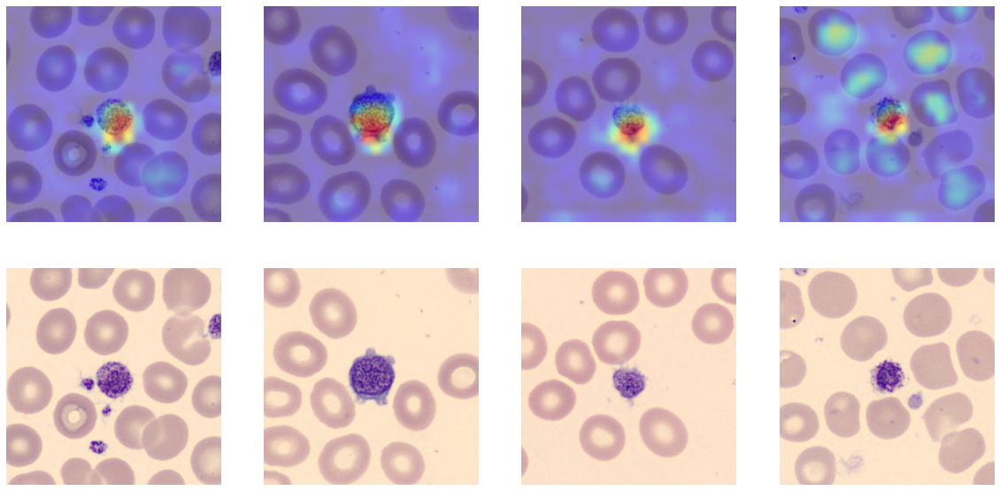

In [21]:
## Cas des PLT : on en affiche plusieurs pour voir si on obtient le même type de carte thermique

df_PLT = df_true[df_true["real"] == 8]

fig = plt.figure(figsize = (20,10))

for i in range(4):
  idx = np.random.choice(a = df_PLT.index)
  img_path = df_PLT.loc[idx,"img_path"]

  big_heatmap, superimposed_img = gradcam(model, img_path, img_height, img_width, class_index = None, alpha = 0.8, plot = False)

  plt.subplot(2,4,i+1)
  plt.imshow(superimposed_img)
  plt.grid(None)
  plt.axis('off')

  plt.subplot(2,4,i+5)
  plt.imshow(plt.imread(img_path))
  plt.grid(None)
  plt.axis('off')

In [ ]:
#####################################################################################################################################
##################################################### Test - Raabin Dataset #########################################################
#####################################################################################################################################

In [ ]:
## Import des données
!cp -r "/content/drive/MyDrive/Leukopy/data/raabin_fulldataset.zip" .
!unzip raabin_fulldataset.zip

In [ ]:
path = Path('/content/raabin_fulldataset/')

df_raabin = pd.DataFrame()
df_raabin["img_path"] = [image_path.as_posix() for ext in ['jpg', 'tif', 'png'] for image_path in path.glob(f'**/*.{ext}')]

df_raabin["label"] = [image_path.parts[3] for ext in ['jpg', 'tif', 'png'] for image_path in path.glob(f'**/*.{ext}')]
df_raabin["label"] = df_raabin["label"].replace(to_replace = {"Neutrophil" : "SNE",
                                                              "Lymphocyte" : "LY",
                                                              "Eosinophil" : "EO",
                                                              "Monocyte" : "MO",
                                                              "Basophil" : "BA"} , value = None)

In [ ]:
raabin_generator = ImageDataGenerator()

raabin_set = raabin_generator.flow_from_dataframe(
    df_raabin,
    directory = None, # utilise x_col
    x_col = 'img_path',
    y_col = 'label',
    target_size = (img_height, img_width),
    color_mode = 'rgb',
    classes = ['BA', 'BNE', 'EO', 'ERB', 'LY', 'MMY', 'MO', 'MY', 'PLT', 'PMY', 'SNE'],
    class_mode = 'categorical',
    batch_size = batch_size,
    shuffle = False,
    preprocessing_function = preprocess_input)

Found 16633 validated image filenames belonging to 11 classes.


In [ ]:
# Toutes les images sont là (TestA, TestB, Train)
pd.Series(raabin_set.classes).value_counts()

10    10862
4      3609
2      1066
6       795
0       301
dtype: int64

In [ ]:
# Les labels ont l'air d'être correctement affectés
#[(classe, filename) for classe, filename in zip (raabin_set.classes, raabin_set.filenames)]

In [ ]:
label_map_raabin = raabin_set.class_indices
print('Raabin :', raabin_set.class_indices)

Raabin : {'BA': 0, 'BNE': 1, 'EO': 2, 'ERB': 3, 'LY': 4, 'MMY': 5, 'MO': 6, 'MY': 7, 'PLT': 8, 'PMY': 9, 'SNE': 10}


In [ ]:
## Chargement du modèle + test sur le dataset d'origine

model = tf.keras.models.load_model("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_blocks4_5")
model.evaluate(testing_set)

80/80 [==============================] - 37s 455ms/step - loss: 0.2034 - accuracy: 0.9261


[0.20339305698871613, 0.9261006116867065]

In [ ]:
## Test sur Raabin
model.evaluate(raabin_set)

520/520 [==============================] - 245s 470ms/step - loss: 2.5357 - accuracy: 0.4745


[2.535691976547241, 0.47447845339775085]

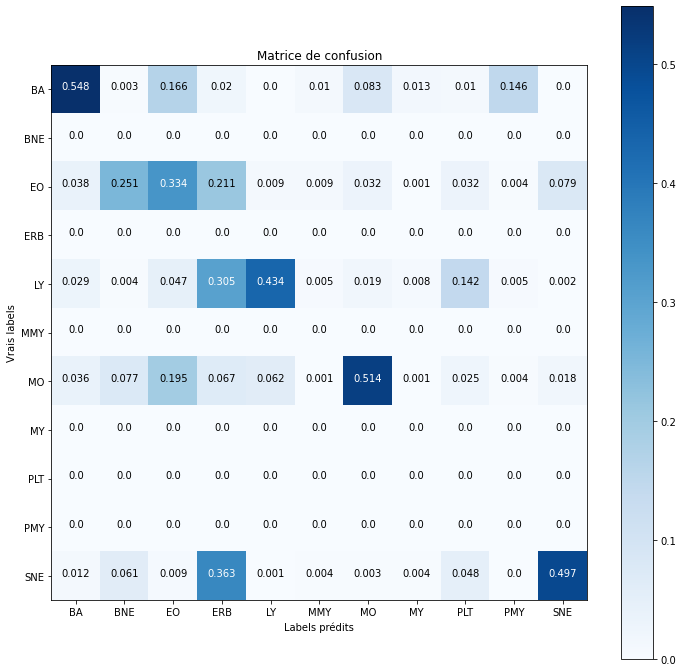

Classification Report : données de la base Raabin


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
BA,0.348837,0.548173,0.426357,301
BNE,0,0,0,0
EO,0.43309,0.333959,0.377119,1066
ERB,0,0,0,0
LY,0.960172,0.434192,0.597977,3609
MMY,0,0,0,0
MO,0.718805,0.514465,0.599707,795
MY,0,0,0,0
PLT,0,0,0,0
PMY,0,0,0,0


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

def print_classification_report(testing_set, labels):

  # Prédiction
  predictions = model.predict(testing_set)
  y_pred = tf.argmax(predictions, axis = 1)

  # Calcul et affichage de la matrice de confusion
  cnf_matrix = confusion_matrix(testing_set.classes, y_pred, normalize = 'true')
  classes = range(len(labels))
  
  plt.figure(figsize = (12,12))
  plt.imshow(cnf_matrix, interpolation = 'nearest', cmap = 'Blues')
  plt.title("Matrice de confusion")
  plt.colorbar()

  tick_marks = np.arange(len(labels))
  plt.xticks(tick_marks, labels)
  plt.yticks(tick_marks, labels)

  for i, j in itertools.product(range(cnf_matrix.shape[0]), 
                                range(cnf_matrix.shape[1])):
    plt.text(j, i, np.around(cnf_matrix[i, j], decimals = 3),
             horizontalalignment = "center",
             color = "white" if cnf_matrix[i, j] > ( cnf_matrix.max() / 2) else "black")

  plt.ylabel('Vrais labels')
  plt.xlabel('Labels prédits')
  plt.show()

  # Rapport de classification 
  report = classification_report(testing_set.classes, y_pred, target_names = labels, output_dict = True)

  df_report = pd.DataFrame(index = list(report.keys())[:-3], columns = list(report["BA"].keys()))
  for key in list(report.keys())[:-3]:
    for column in list(report["BA"].keys()):
      df_report.loc[key, column] = report[key][column]
  
  print("Classification Report : données de la base Raabin")
  return display(df_report)

print_classification_report(raabin_set, label_map_raabin)

In [ ]:

################################################################################################################################################
##################################################### Exploration - Feature Extraction #########################################################
################################################################################################################################################
"""
Les données extraites ici sont utilisées dans un autre notebook (on fait de la PCA et du clustering sur ces données) : l'intérêt des résultats obtenus est faible.
"""

In [ ]:
model = load_model("/content/drive/MyDrive/Leukopy/VGG19_TL_11/model_fullsave_ftblock4")

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 360, 360, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 360, 360, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 360, 360, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 180, 180, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 180, 180, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 180, 180, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 90, 90, 128)       0     

In [ ]:
from tensorflow.keras import Model

#### Extracteur de features ####
extraction_model = Model(inputs = model.input, outputs = model.layers[-5].output)

#### Test avec les images réelles
train_generator_fe = ImageDataGenerator()
valid_generator_fe = ImageDataGenerator()
test_generator_fe = ImageDataGenerator()

training_set_fe = train_generator_fe.flow_from_dataframe(df_train, 
                                                         directory = None, # utilise x_col
                                                         x_col = 'img_path', 
                                                         y_col = 'label',
                                                         target_size = (img_height, img_width), 
                                                         color_mode = 'rgb',
                                                         classes = None,   # utilise y_col
                                                         class_mode = 'categorical', 
                                                         batch_size = batch_size,
                                                         shuffle = False,
                                                         preprocessing_function = preprocess_input)

validation_set_fe = valid_generator_fe.flow_from_dataframe(df_valid, 
                                                           directory = None, # utilise x_col
                                                           x_col = 'img_path', 
                                                           y_col = 'label',
                                                           target_size = (img_height, img_width), 
                                                           color_mode = 'rgb',
                                                           classes = None,   # utilise y_col
                                                           class_mode = 'categorical', 
                                                           batch_size = batch_size, 
                                                           shuffle = False,
                                                           preprocessing_function = preprocess_input)

testing_set_fe = test_generator_fe.flow_from_dataframe(df_test, 
                                                       directory = None, # utilise x_col
                                                       x_col = 'img_path', 
                                                       y_col = 'label',
                                                       target_size = (img_height, img_width),
                                                       color_mode = 'rgb',
                                                       classes = None,   # utilise y_col
                                                       class_mode = 'categorical', 
                                                       batch_size = batch_size, 
                                                       shuffle = False, 
                                                       preprocessing_function = preprocess_input)

#### Stockage des features extraites :
X_train_features = extraction_model.predict(training_set_fe)
X_valid_features = extraction_model.predict(validation_set_fe)
X_test_features = extraction_model.predict(testing_set_fe)

# Labels/Index connection :
#label_map = training_set.class_indices

Y_train = training_set_fe.classes
Y_valid = validation_set_fe.classes
Y_test = testing_set_fe.classes

Found 12677 validated image filenames belonging to 11 classes.
Found 1730 validated image filenames belonging to 11 classes.
Found 2544 validated image filenames belonging to 11 classes.


In [ ]:
## TESTS - Structure de X_train_features par rapport à df_train : 
#### OK, images rangées dans le même ordre.

#df_train_extracted = pd.DataFrame(X_train_features)
#print(df_train_extracted.head(1))

#image = tf.keras.preprocessing.image.load_img(df_train.loc[0, "img_path"], target_size = (img_height, img_width))
#input_arr = tf.keras.preprocessing.image.img_to_array(image)
#input_arr = np.array([input_arr])  # Convert single image to a batch.

#predictions = extraction_model.predict(input_arr)

#df_plop = pd.DataFrame(predictions)
#print(df_plop.head())

In [ ]:
## On peut fusionner les dataframes : output de VGG, label, img_path + fichiers .csv

## Renverse "label_map"
inv_label_map = {v: k for k, v in label_map.items()}


## Train
df_train_extracted = pd.DataFrame(X_train_features)
df_train_extracted["label"] = training_set_fe.classes   # Elles sont rangées dans le même ordre que le dataframe (shuffle = False)
df_train_extracted["cell_type"] = df_train_extracted["label"].replace(to_replace = inv_label_map , value = None)
df_train_extracted["img_path"] = df_train["img_path"]

NN_probas = model.predict(training_set_fe)
df_train_extracted["predicted_label"] =  tf.argmax(NN_probas, axis = 1)

for i in range(n_classes):
  colname = "proba_"+str(i)
  df_train_extracted[colname] = NN_probas[:,i]

df_train_extracted.to_csv(path_or_buf = 'train_features.csv',
                          sep = ',',
                          na_rep = 'NaN',
                          header = True,
                          index = True)

## Valid
df_valid_extracted = pd.DataFrame(X_valid_features)
df_valid_extracted["label"] = validation_set_fe.classes
df_valid_extracted["cell_type"] = df_valid_extracted["label"].replace(to_replace = inv_label_map , value = None)
df_valid_extracted["img_path"] = df_valid["img_path"]

NN_probas = model.predict(validation_set_fe)
df_valid_extracted["predicted_label"] =  tf.argmax(NN_probas, axis = 1)

for i in range(n_classes):
  colname = "proba_"+str(i)
  df_valid_extracted[colname] = NN_probas[:,i]

df_valid_extracted.to_csv(path_or_buf = 'valid_features.csv',
                          sep = ',',
                          na_rep = 'NaN',
                          header = True,
                          index = True)

## Test
df_test_extracted = pd.DataFrame(X_test_features)
df_test_extracted["label"] = testing_set_fe.classes
df_test_extracted["cell_type"] = df_test_extracted["label"].replace(to_replace = inv_label_map , value = None)
df_test_extracted["img_path"] = df_test["img_path"]

NN_probas = model.predict(testing_set_fe)
df_test_extracted["predicted_label"] =  tf.argmax(NN_probas, axis = 1)

for i in range(n_classes):
  colname = "proba_"+str(i)
  df_test_extracted[colname] = NN_probas[:,i]

df_test_extracted.to_csv(path_or_buf = 'test_features.csv',
                         sep = ',',
                         na_rep = 'NaN',
                         header = True,
                         index = True)

# Sauvegarde sur le Drive
!cp -r "train_features.csv" "/content/drive/MyDrive/Leukopy/VGG19_TL_11"
!cp -r "valid_features.csv" "/content/drive/MyDrive/Leukopy/VGG19_TL_11"
!cp -r "test_features.csv" "/content/drive/MyDrive/Leukopy/VGG19_TL_11"

In [ ]:
df_train_extracted.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279,label,cell_type,img_path,predicted_label,proba_0,proba_1,proba_2,proba_3,proba_4,proba_5,proba_6,proba_7,proba_8,proba_9,proba_10
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,2.264380,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,6.930131,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,MMY,/content/main_dataset/training_set/MMY_749723.jpg,5,2.768961e-08,2.374016e-05,3.399902e-08,3.969901e-09,3.690830e-10,9.342719e-01,2.818295e-08,6.570387e-02,7.479149e-11,3.107008e-07,5.814115e-10
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,2.285428,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,ERB,/content/main_dataset/training_set/ERB_483425.jpg,3,1.895603e-13,3.400371e-11,9.732254e-12,1.000000e+00,3.753224e-10,2.906655e-12,2.774876e-17,1.147071e-13,4.850379e-09,8.283190e-21,5.654941e-13
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.485849,0.0,0.0,0.0,0.00000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,9.384023,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,BA,/content/main_dataset/training_set/BA_790227.jpg,0,1.000000e+00,3.331586e-24,1.915701e-19,4.688564e-18,1.360841e-20,1.082073e-18,1.992843e-18,1.796827e-13,5.034360e-24,7.202019e-15,1.017666e-26
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.109337,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.171298,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10,SNE,/content/main_dataset/training_set/NEUTROPHIL_...,10,1.389999e-10,3.760305e-05,2.027564e-08,2.522796e-11,2.391691e-10,7.373384e-13,4.308351e-10,4.208666e-15,5.636030e-15,4.695896e-22,9.999623e-01
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.856020,0.0,0.0,0.0,4.05596,8.039733,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,6.646590,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,EO,/content/main_dataset/training_set/EO_577819.jpg,2,6.464862e-17,1.655744e-09,1.000000e+00,9.719356e-17,1.661865e-14,4.949994e-11,7.084803e-12,2.049174e-17,1.075462e-22,8.457034e-22,6.906739e-14


In [ ]:
df_valid_extracted.head(5)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1254,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279,label,img_path,predicted_label,proba_0,proba_1,proba_2,proba_3,proba_4,proba_5,proba_6,proba_7,proba_8,proba_9,proba_10
0,0.0,0.0,0.0,0.0,0.0,2.301939,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.585075,0.0,0.0,0.0,5.756032,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.304148,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9,/content/main_dataset/validation_set/PMY_49972...,9,6.268177e-12,6.666063e-17,1.224385e-15,1.115986e-14,2.852111e-20,5.272130e-07,2.978840e-08,1.172355e-04,1.451595e-21,9.998822e-01,6.956506e-25
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.286164,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6,/content/main_dataset/validation_set/MO_994944...,6,5.854576e-14,1.470154e-09,8.279071e-08,1.188042e-14,8.541727e-09,1.452712e-07,9.999998e-01,5.237195e-08,6.420209e-16,1.334133e-08,9.846362e-14
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.513417,3.785457,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.036993,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.903536,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10,/content/main_dataset/validation_set/SNE_79673...,10,4.797336e-11,2.397245e-01,1.450457e-07,4.356613e-09,4.229335e-10,1.379294e-05,1.035766e-09,4.425045e-08,1.567888e-10,1.449326e-15,7.602615e-01
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,3.022686,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,/content/main_dataset/validation_set/ERB_42486...,3,1.581419e-11,2.964884e-11,4.553456e-11,1.000000e+00,4.016026e-08,2.151762e-11,1.014888e-15,1.172653e-12,3.238152e-08,8.284968e-19,1.261613e-12
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.637319,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.116751,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,2.951136,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.043003,0.0,0.0,0.0,1.746967,0.0,0.0,0.0,0.0,0.0,0.0,2.231678,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8,/content/main_dataset/validation_set/PLATELET_...,8,7.970988e-17,6.165476e-16,1.957784e-13,1.582088e-08,3.903076e-11,1.340134e-16,7.398148e-20,1.443997e-18,1.000000e+00,2.369481e-22,3.101201e-16


In [ ]:
# Images mal classées => regarder les probas (dernières colonnes)

df_test_extracted[df_test_extracted["label"] != df_test_extracted["predicted_label"]].head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1254,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279,label,img_path,predicted_label,proba_0,proba_1,proba_2,proba_3,proba_4,proba_5,proba_6,proba_7,proba_8,proba_9,proba_10
11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,2.124056,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.766320,0.0,0.0,0.0,0.0,0.0,0.0,7.076828,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5,/content/main_dataset/testing_set/MMY_218155.jpg,7,1.662864e-05,6.318625e-10,3.808651e-12,1.783767e-10,3.459658e-15,1.296306e-02,2.914823e-09,9.056994e-01,1.448719e-13,8.132086e-02,2.162522e-16
22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.114127,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10,/content/main_dataset/testing_set/SNE_113678.jpg,1,3.562448e-15,6.395627e-01,9.068469e-08,2.215371e-06,4.559773e-10,7.089595e-09,9.282167e-12,1.353809e-09,5.642129e-09,5.616406e-19,3.604350e-01
24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.161765,0.0,0.0,0.0,0.231744,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.179778,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,/content/main_dataset/testing_set/BA_773081.jpg,6,4.531740e-08,5.965198e-14,3.729519e-09,6.202387e-18,1.503085e-12,9.142348e-11,9.999998e-01,4.195253e-08,3.191911e-18,2.035542e-07,4.798305e-17
33,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,1.846975,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1.72386,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10,/content/main_dataset/testing_set/SNE_242915.jpg,1,5.309365e-13,8.121166e-01,1.219173e-08,1.631138e-08,7.388842e-11,1.936574e-06,3.924503e-09,3.348853e-07,6.971513e-09,2.445702e-15,1.878811e-01
36,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,/content/main_dataset/testing_set/BNE_316390.jpg,10,4.554317e-16,3.738619e-01,9.671866e-11,1.845006e-12,1.227605e-13,6.415847e-08,4.323227e-10,1.129982e-09,2.844125e-13,2.305215e-18,6.261380e-01
